In [1]:
import warnings
warnings.simplefilter('ignore')

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn.datasets import load_breast_cancer

from sklearn.ensemble import RandomForestClassifier as RFC

from sklearn.model_selection import train_test_split as tts

import seaborn as sns

In [2]:
data=load_breast_cancer()

In [3]:
# Note that we need to reverse the original '0' and '1' mapping in order to end up with this mapping:
# Benign = 0 (negative class)
# Malignant = 1 (positive class)

li_classes = [data.target_names[1], data.target_names[0]]
li_target = [1 if x==0 else 0 for x in list(data.target)]
li_ftrs = list(data.feature_names)

In [4]:
print("There are 2 target classes:")
print("li_classes", li_classes)
print("---")
print("Target class distribution from a total of %d target values:" % len(li_target))
print(pd.Series(li_target).value_counts())
print("---")

There are 2 target classes:
li_classes ['benign', 'malignant']
---
Target class distribution from a total of 569 target values:
0    357
1    212
dtype: int64
---


In [5]:
df_all = pd.DataFrame(data.data[:,:], columns=li_ftrs)
print("Describe dataframe, first 6 columns:")
print(df_all.iloc[:,:6].describe().to_string())

Describe dataframe, first 6 columns:
       mean radius  mean texture  mean perimeter    mean area  mean smoothness  mean compactness
count   569.000000    569.000000      569.000000   569.000000       569.000000        569.000000
mean     14.127292     19.289649       91.969033   654.889104         0.096360          0.104341
std       3.524049      4.301036       24.298981   351.914129         0.014064          0.052813
min       6.981000      9.710000       43.790000   143.500000         0.052630          0.019380
25%      11.700000     16.170000       75.170000   420.300000         0.086370          0.064920
50%      13.370000     18.840000       86.240000   551.100000         0.095870          0.092630
75%      15.780000     21.800000      104.100000   782.700000         0.105300          0.130400
max      28.110000     39.280000      188.500000  2501.000000         0.163400          0.345400


In [6]:
pd.set_option('display.max_columns', None)
df_all['diagnosis'] = li_target
df_all.tail()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,diagnosis
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.256,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,1
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.463,5.203,99.04,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,1
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.075,3.425,48.55,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,1
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.595,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,1
568,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,0.3857,1.428,2.548,19.15,0.007189,0.00466,0.00000,0.00000,0.02676,0.002783,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,0


In [7]:
df_all.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,diagnosis
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.372583
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,0.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


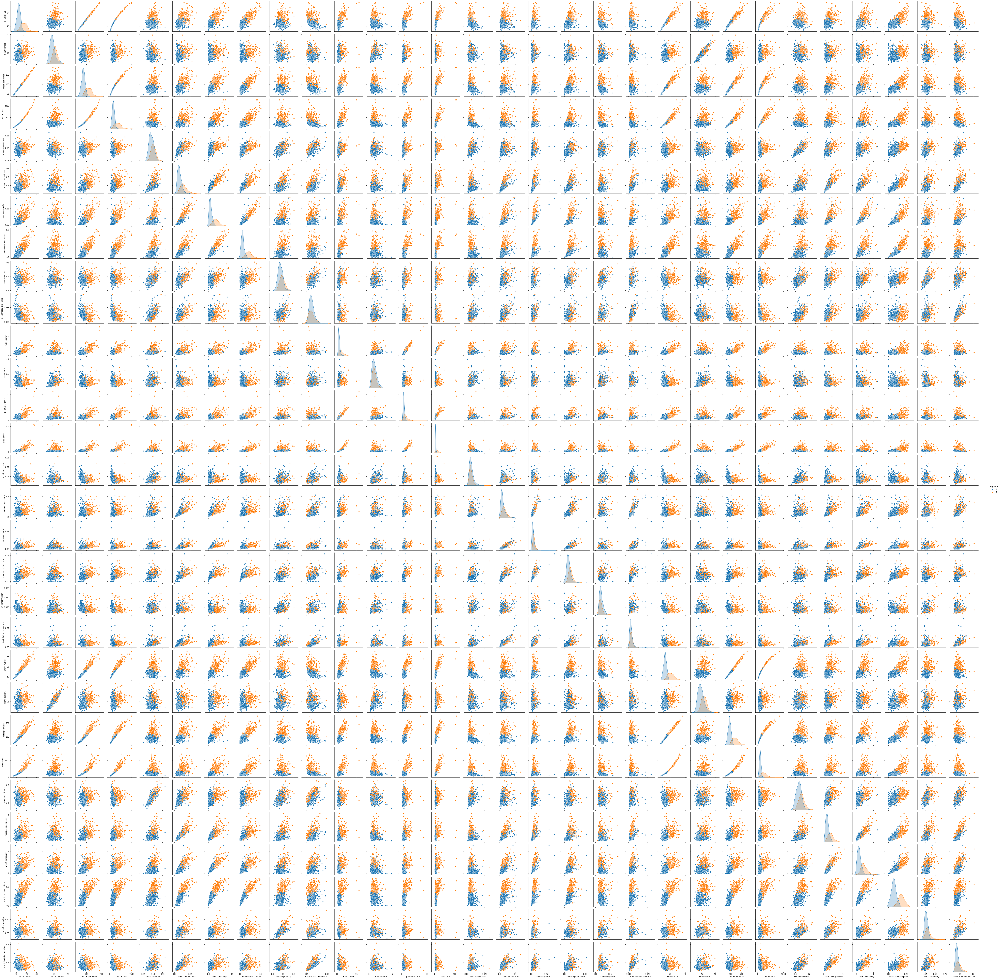

In [10]:
sns.pairplot(df_all, hue="diagnosis")

mpl.rc('ytick', labelsize=30) 
mpl.rc('xtick', labelsize=30)


<AxesSubplot:>

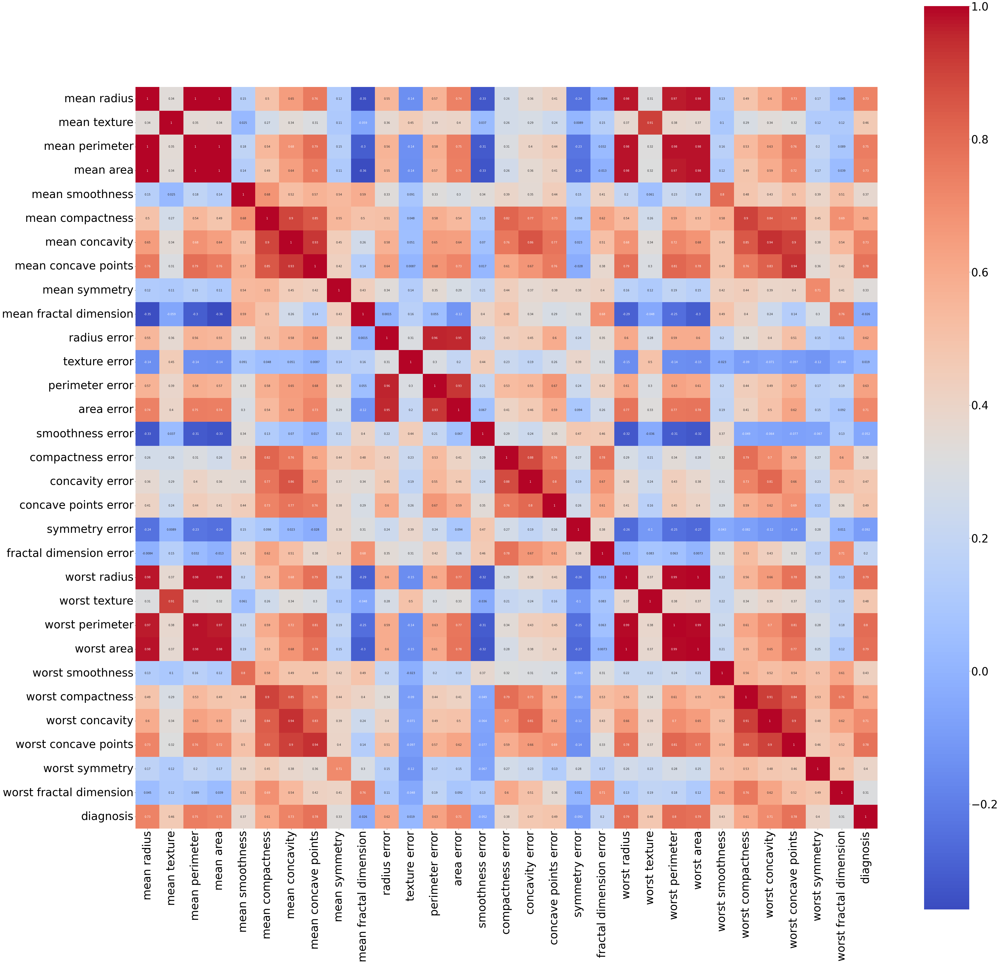

In [11]:
plt.figure(figsize=(60,60))
mpl.rc('xtick', labelsize=40) 
mpl.rc('ytick', labelsize=40) 
sns.heatmap(df_all.corr(method='spearman'), annot=True, square=True, cmap='coolwarm', annot_kws={'size': 10})


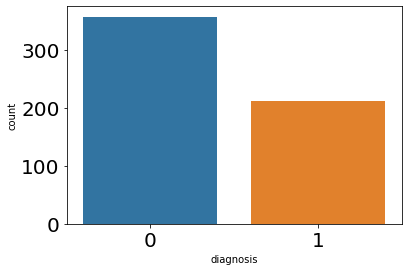

In [14]:
mpl.rc('xtick', labelsize=20) 
mpl.rc('ytick', labelsize=20)
ax = sns.countplot(x = df_all.diagnosis) 

In [13]:
def correlation_1_vs_all(df, feature, threshold):
    pd.set_option('display.max_rows', None)
    df = df.corr().abs().unstack().sort_values(kind="quicksort", ascending=False).reset_index()
    df.rename(columns={"level_0": "Feature 1", "level_1": "Feature 2", 0: 'Correlation Coefficient'}, inplace=True)
    df = df.drop(df[df['Correlation Coefficient'] == 1.0].index)
    return df[(df['Feature 1'] == feature) & (df['Correlation Coefficient'] > threshold)]

def correlation_all_vs_all(df, threshold):
    pd.set_option('display.max_rows', None)
    df = df.corr().abs().unstack().sort_values(kind="quicksort", ascending=False).reset_index()
    df.rename(columns={"level_0": "Feature 1", "level_1": "Feature 2", 0: 'Correlation Coefficient'}, inplace=True)
    df.drop(df.iloc[1::2].index, inplace=True)
    df = df.drop(df[df['Correlation Coefficient'] == 1.0].index)
    return df[df['Correlation Coefficient'] > threshold]

In [15]:
correlation_all_vs_all(df_all, 0.5)


,Feature 1,Feature 2,Correlation Coefficient
32,mean radius,mean perimeter,0.997855
34,worst perimeter,worst radius,0.993708
36,mean radius,mean area,0.987357
38,mean perimeter,mean area,0.986507
40,worst area,worst radius,0.984015
42,worst area,worst perimeter,0.977578
44,radius error,perimeter error,0.972794
46,worst perimeter,mean perimeter,0.970387
48,mean radius,worst radius,0.969539
50,mean perimeter,worst radius,0.969476


In [107]:
correlation_1_vs_all(df_all, 'diagnosis', 0.5)
        

,Feature 1,Feature 2,Correlation Coefficient
120,diagnosis,worst concave points,0.793566
124,diagnosis,worst perimeter,0.782914
125,diagnosis,mean concave points,0.776614
128,diagnosis,worst radius,0.776454
154,diagnosis,mean perimeter,0.742636
160,diagnosis,worst area,0.733825
165,diagnosis,mean radius,0.730029
185,diagnosis,mean area,0.708984
194,diagnosis,mean concavity,0.696360
233,diagnosis,worst concavity,0.659610


In [108]:
correlation_1_vs_all(df_all, 'worst concave points', 0.5)

,Feature 1,Feature 2,Correlation Coefficient
71,worst concave points,mean concave points,0.910155
81,worst concave points,mean concavity,0.861323
85,worst concave points,worst concavity,0.855434
97,worst concave points,worst perimeter,0.816322
102,worst concave points,mean compactness,0.815573
115,worst concave points,worst compactness,0.801080
119,worst concave points,diagnosis,0.793566
121,worst concave points,worst radius,0.787424
131,worst concave points,mean perimeter,0.771241
145,worst concave points,worst area,0.747419


In [16]:
def feature_selector(df, y, threshold_y, threshold_x):

    temp_features_list = correlation_1_vs_all(df, y, threshold_y)['Feature 2'].tolist() # take main variables
    chosen_features = []

    while len(temp_features_list) > 0:

        x = temp_features_list[0]
        chosen_features.append(x)
        temp_features_list.remove(x)
        temp_correlation_list = correlation_1_vs_all(df, x, threshold_x)['Feature 2'].tolist() # take main variables

        for x in temp_correlation_list:
            if x in temp_features_list:
                temp_features_list.remove(x)

    return chosen_features

feature_selector(df_all, 'diagnosis', 0.5, 0.8)

['worst concave points', 'worst radius', 'radius error']

## random forest classifier

In [20]:
from sklearn.preprocessing import  StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

In [29]:
## Find optimal paramenters for random forest

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score as acc


min_corr_y = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
max_corr_x = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

feature_selection_matrix = np.zeros([11,11])
number_features_matrix= np.zeros([11,11])

y_index=0
for y in min_corr_y:
    x_index=0
    for x in max_corr_x:
        print("min corr y", y , "max corr x", x)
        chosen_variables_rf = feature_selector(df_all, 'diagnosis', y, x)
        if (len(chosen_variables_rf) > 1):
            print("Chosen variables: ", chosen_variables_rf)
            df_all_rf = df_all[chosen_variables_rf]

            X_train, X_test, y_train, y_test = tts(df_all_rf,li_target,test_size=0.2, train_size=0.8, random_state=42)


            sc = StandardScaler()
            X_train = sc.fit_transform(X_train)
            X_test = sc.transform(X_test)
#
#
            rf=RFC()
#
            parameters = {'n_estimators': [25,30,35,40,45],
                        'min_samples_split' : [3,4,5,6,7,8,9,10],
                        'min_samples_leaf'    : [1,2,3,4,5],
                        'max_depth'   : [2,3,4,5,6,7,8],
                          'random_state' :[42]
                         }
#
            Grid_rf = GridSearchCV(estimator=rf, param_grid = parameters, cv = 2, n_jobs=7, scoring='accuracy')
            Grid_rf.fit(X_train, y_train)
            print(" Results from Grid Search " )
            print("\n The best estimator across ALL searched params:\n",Grid_rf.best_estimator_)
#
            rf = Grid_rf.best_estimator_
            rf.fit(X_train , y_train)
            y_pred = rf.predict(X_test)
#
            train_accuracy=rf.score(X_train, y_train)  # accuracy
            test_accuracy=rf.score(X_test, y_test)
            acc_verdadero = acc(y_test, y_pred)

#
            print('train acc : ', train_accuracy, 'test acc: ', test_accuracy, 'acc verdadero: ', acc_verdadero )
        

            
            print('----------------------------------------------- ')
            feature_selection_matrix[x_index, y_index] = acc_verdadero
            number_features_matrix[x_index, y_index] = len(chosen_variables_rf)
            x_index+=1
        
        else:
            print("not enough variables")
            print('----------------------------------------------- ')

            x_index+=1
    
    y_index+=1

min corr y 0 max corr x 0
not enough variables
----------------------------------------------- 
min corr y 0 max corr x 0.1
Chosen variables:  ['worst concave points', 'symmetry error']
 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=3, min_samples_leaf=4, min_samples_split=3,
                       n_estimators=30, random_state=42)
train acc :  0.9274725274725275 test acc:  0.9122807017543859 acc verdadero:  0.9122807017543859
----------------------------------------------- 
min corr y 0 max corr x 0.2
Chosen variables:  ['worst concave points', 'smoothness error']
 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=5, min_samples_leaf=4, min_samples_split=9,
                       n_estimators=40, random_state=42)
train acc :  0.9318681318681319 test acc:  0.9122807017543859 acc verdadero:  0.9122807017543859
----------------------------------------------- 
min corr

 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=6, min_samples_leaf=2, min_samples_split=3,
                       n_estimators=35, random_state=42)
train acc :  0.9802197802197802 test acc:  0.9473684210526315 acc verdadero:  0.9473684210526315
----------------------------------------------- 
min corr y 0.1 max corr x 0.8
Chosen variables:  ['worst concave points', 'worst radius', 'radius error', 'worst texture', 'worst smoothness', 'worst symmetry', 'concave points error', 'mean symmetry', 'worst fractal dimension', 'compactness error']
 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=7, min_samples_split=3, n_estimators=25,
                       random_state=42)
train acc :  0.9934065934065934 test acc:  0.9649122807017544 acc verdadero:  0.9649122807017544
----------------------------------------------- 
min corr y 0.1 max corr x 0.9
Chosen variables:  ['worst

 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=2, min_samples_split=3, n_estimators=35,
                       random_state=42)
train acc :  0.9252747252747253 test acc:  0.9035087719298246 acc verdadero:  0.9035087719298246
----------------------------------------------- 
min corr y 0.3 max corr x 0.5
Chosen variables:  ['worst concave points', 'worst texture', 'mean symmetry']
 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=5, min_samples_leaf=3, min_samples_split=9,
                       n_estimators=45, random_state=42)
train acc :  0.9428571428571428 test acc:  0.9035087719298246 acc verdadero:  0.9035087719298246
----------------------------------------------- 
min corr y 0.3 max corr x 0.6
Chosen variables:  ['worst concave points', 'radius error', 'worst texture', 'worst smoothness', 'worst symmetry']
 Results from Grid Search 

 The best estimator acros

 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=2, min_samples_split=3, n_estimators=35,
                       random_state=42)
train acc :  0.9362637362637363 test acc:  0.9035087719298246 acc verdadero:  0.9035087719298246
----------------------------------------------- 
min corr y 0.5 max corr x 0.7
Chosen variables:  ['worst concave points', 'radius error']
 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=2, min_samples_split=3, n_estimators=35,
                       random_state=42)
train acc :  0.9362637362637363 test acc:  0.9035087719298246 acc verdadero:  0.9035087719298246
----------------------------------------------- 
min corr y 0.5 max corr x 0.8
Chosen variables:  ['worst concave points', 'worst radius', 'radius error']
 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(max_depth=5, min_samples_split

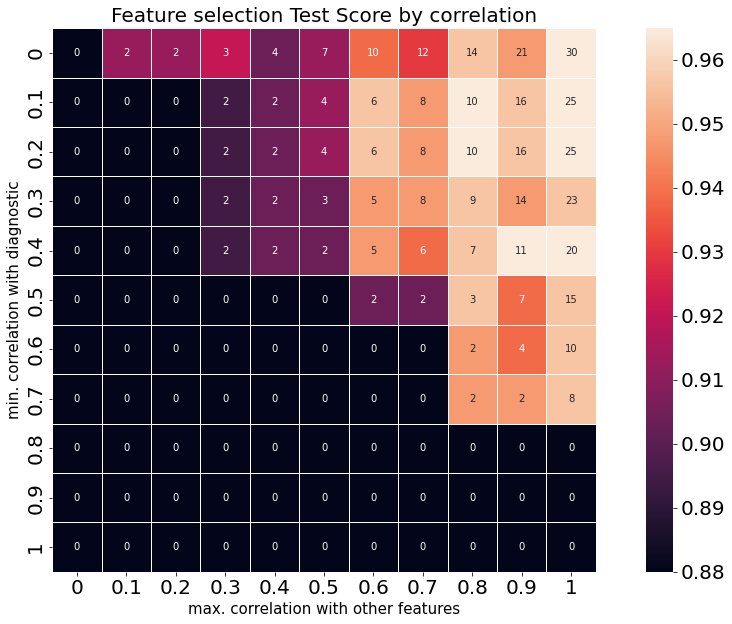

In [30]:
min_corr_y = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
max_corr_x = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

fig,ax = plt.subplots(1,1,figsize=(18,10))
M = feature_selection_matrix.max()
labels = number_features_matrix.T

ax = sns.heatmap(feature_selection_matrix.T,xticklabels=max_corr_x, yticklabels=min_corr_y,
                 annot=labels, linewidth=1, linecolor='w', square=True,
                vmin=0.88, vmax=M, fmt='.4g')

colorbar = ax.collections[0].colorbar

plt.title('Feature selection Test Score by correlation', fontsize = 20) # title with fontsize 20
plt.xlabel('max. correlation with other features', fontsize = 15) # x-axis label with fontsize 15
plt.ylabel('min. correlation with diagnostic', fontsize = 15) # y-axis label with fontsize 15
plt.show()

In [33]:
feature_selector(df_all, 'diagnosis', 0.1, 0.8)

['worst concave points',
 'worst radius',
 'radius error',
 'worst texture',
 'worst smoothness',
 'worst symmetry',
 'concave points error',
 'mean symmetry',
 'worst fractal dimension',
 'compactness error']

In [115]:
chosen_variables_rf = feature_selector(df_all, 'diagnosis', 0.1, 0.8)
print("Chosen variables: ", chosen_variables_rf)
df_all_rf = df_all[chosen_variables_rf]
X_train, X_test, y_train, y_test = tts(df_all_rf,li_target,test_size=0.2, train_size=0.8, random_state=42)
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
rf=RFC()
                   
parameters = {'n_estimators': [15,20,25,30,35,40,45],
            'min_samples_split' : [1,2,3,4,5,6,7,8,9,10],
            'min_samples_leaf'    : [1,2,3,4,5],
            'max_depth'   : [2,3,5,5,6,7,8],
              'random_state' :[42]}
             
Grid_rf = GridSearchCV(estimator=rf, param_grid = parameters, cv = 2, n_jobs=7, scoring='accuracy')
Grid_rf.fit(X_train, y_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_rf.best_estimator_)
rf = Grid_rf.best_estimator_
rf.fit(X_train , y_train)
y_pred = rf.predict(X_test)
train_accuracy=rf.score(X_train, y_train)  # accuracy
test_accuracy=rf.score(X_test, y_test)
acc_verdadero = acc(y_test, y_pred)
print('train acc : ', train_accuracy, 'test acc: ', test_accuracy, 'acc verdadero: ', acc_verdadero )

print('----------------------------------------------- ')
      
     

Chosen variables:  ['worst concave points', 'worst radius', 'radius error', 'worst texture', 'worst smoothness', 'worst symmetry', 'concave points error', 'mean symmetry', 'worst fractal dimension', 'compactness error']
 Results from Grid Search 

 The best estimator across ALL searched params:
 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=30,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)
train acc :  0.9956043956043956 test acc:  0.9649122807017544 acc verdadero:  0.9649122807017544
----------------------------------------------- 


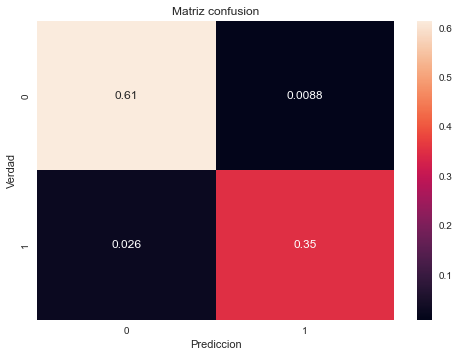

In [121]:
from sklearn.metrics import confusion_matrix as cm

ax=sns.heatmap(cm(y_test, y_pred)/sum(sum(cm(y_test, y_pred))), 
               annot=True)

#b, t=ax.get_ylim()  # esto era porque me salia recortado
#ax.set_ylim(b+0.5, t-0.5)

plt.title('Matriz confusion')
plt.ylabel('Verdad')
plt.xlabel('Prediccion')
plt.show();

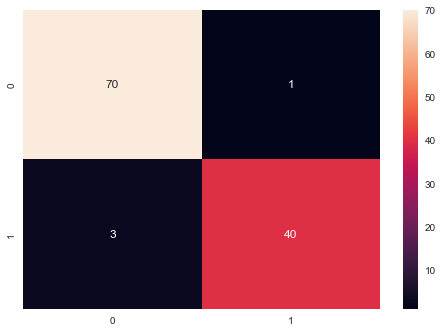

In [120]:
ax=sns.heatmap(cm(y_test, y_pred), 
               annot=True)

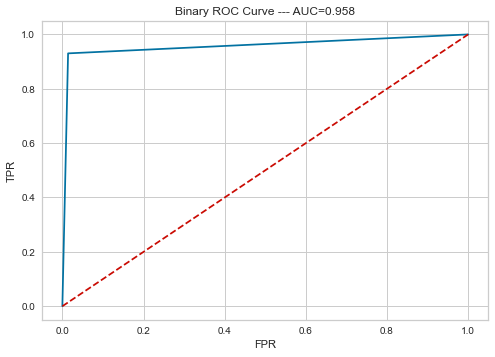

In [122]:
from sklearn.metrics import roc_curve as roc
from sklearn.metrics import roc_auc_score as auc

fpr, tpr, umbrales=roc(y_test, y_pred)  # cuidao, no y_pred
a=auc(y_test, y_pred)

plt.plot(fpr, tpr)
plt.plot(fpr, fpr, 'r--')

plt.xlabel('FPR')
plt.ylabel('TPR')

plt.title('Binary ROC Curve --- AUC={:.3f}'.format(a))  # {:.3f} formato del numero

plt.show();

In [123]:
import scikitplot as skplt

y_prob=rf.predict_proba(X_test)

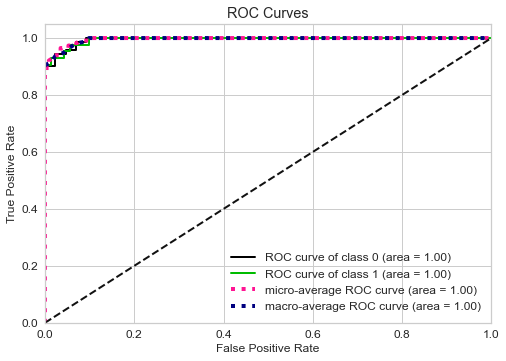

In [128]:
skplt.metrics.plot_roc(y_test, y_prob);


## pycaret

In [90]:
dataset = df_all
data_train=dataset.sample(frac=0.80, random_state=42)   # separamos aunque no lo vamos a usar porque pycaret lo hace automaticamente
data_test=dataset.drop(data_train.index).reset_index(drop=True)
data_train.shape, data_test.shape

((455, 31), (114, 31))

In [91]:
data_train['diagnosis'].value_counts()

0    290
1    165
Name: diagnosis, dtype: int64

In [195]:
from pycaret.classification import *
clf1 = setup(data = dataset, target = 'diagnosis', session_id=123
            #,feature_selection = True, feature_selection_threshold= 0.8
            #,remove_multicollinearity = True, multicollinearity_threshold = 0.9
            ,feature_interaction = True
            ,interaction_threshold = 0.1
            ,feature_ratio = True
            #,trigonometry_features = True
            #,pca=True
            #,polynomial = False ,polynomial_degree = 2,polynomial_threshold = 0.1
            )
             

,Description,Value
0,session_id,123
1,Target,diagnosis
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(569, 31)"
5,Missing Values,False
6,Numeric Features,30
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [196]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ada,Ada Boost Classifier,0.9799,0.9970,0.9652,0.9804,0.9718,0.9562,0.9573,0.0390
et,Extra Trees Classifier,0.9722,0.9950,0.9376,0.9867,0.9595,0.9385,0.9414,0.0240
lightgbm,Light Gradient Boosting Machine,0.9722,0.9936,0.9371,0.9882,0.9601,0.9389,0.9418,0.0720
catboost,CatBoost Classifier,0.9722,0.9966,0.9443,0.9808,0.9604,0.9391,0.9415,8.2220
rf,Random Forest Classifier,0.9697,0.9952,0.9305,0.9875,0.9562,0.9332,0.9363,0.0320
xgboost,Extreme Gradient Boosting,0.9697,0.9911,0.9371,0.9804,0.9567,0.9335,0.9358,0.0500
gbc,Gradient Boosting Classifier,0.9647,0.9896,0.9300,0.9727,0.9493,0.9223,0.9245,0.1420
lr,Logistic Regression,0.9621,0.9948,0.9381,0.9595,0.9469,0.9175,0.9196,0.0280
ridge,Ridge Classifier,0.9496,0.0000,0.8681,0.9929,0.9245,0.8870,0.8932,0.0030
nb,Naive Bayes,0.9420,0.9912,0.8681,0.9713,0.9125,0.8698,0.8768,0.0030


AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=123)

In [197]:
lg=create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,0.9750,1.0000,1.0000,0.9333,0.9655,0.9459,0.9473
2,0.9750,0.9835,0.9286,1.0000,0.9630,0.9441,0.9456
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9750,1.0000,1.0000,0.9375,0.9677,0.9474,0.9487
5,0.9500,0.9947,0.9333,0.9333,0.9333,0.8933,0.8933
6,0.9750,1.0000,0.9333,1.0000,0.9655,0.9459,0.9473
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,0.9487,0.9914,0.8571,1.0000,0.9231,0.8850,0.8909


In [198]:
predict_model(lg);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.9883,0.9949,0.9853,0.9853,0.9853,0.9756,0.9756


In [199]:
tuned_lg=tune_model(lg)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9750,0.9808,0.9286,1.0000,0.9630,0.9441,0.9456
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9500,0.9947,0.9333,0.9333,0.9333,0.8933,0.8933
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,0.9750,1.0000,0.9333,1.0000,0.9655,0.9459,0.9473
8,0.9744,1.0000,0.9286,1.0000,0.9630,0.9434,0.9449
9,0.9487,0.9800,0.8571,1.0000,0.9231,0.8850,0.8909


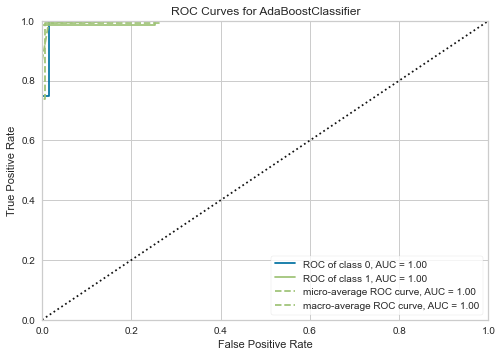

In [200]:
## AUC Plot¶

plot_model(tuned_lg, plot = 'auc')

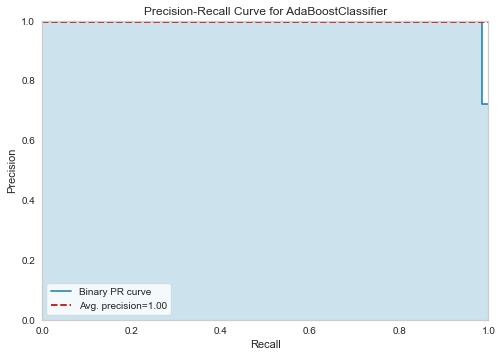

In [201]:
## Precision-Recall Curve¶
plot_model(tuned_lg, plot = 'pr')

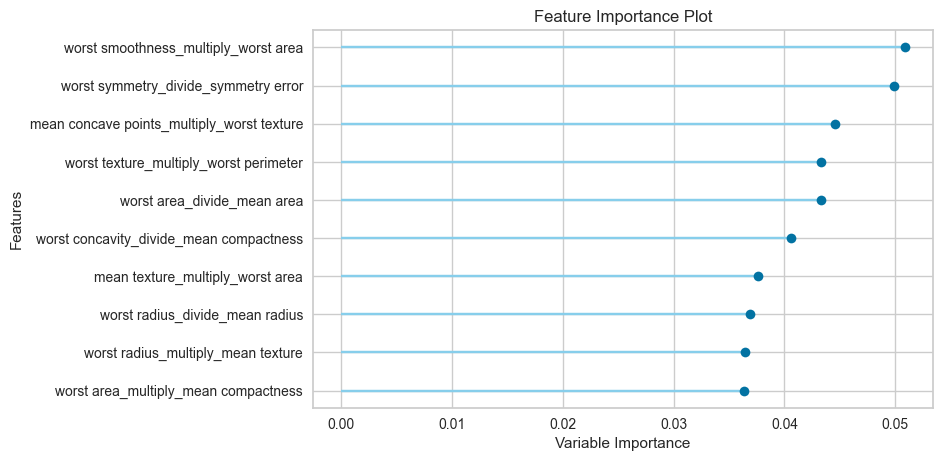

In [202]:
#Feature Importance Plot¶
plot_model(tuned_lg, plot='feature')



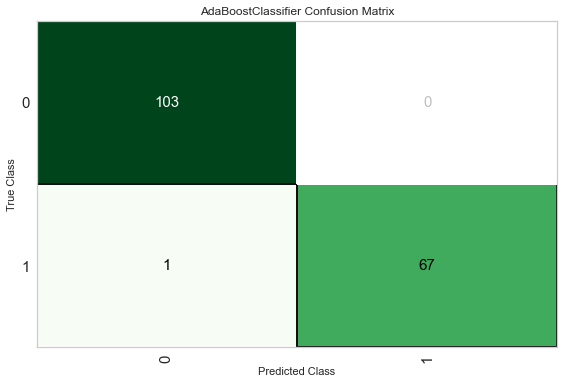

In [203]:
plot_model(tuned_lg, plot = 'confusion_matrix')

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

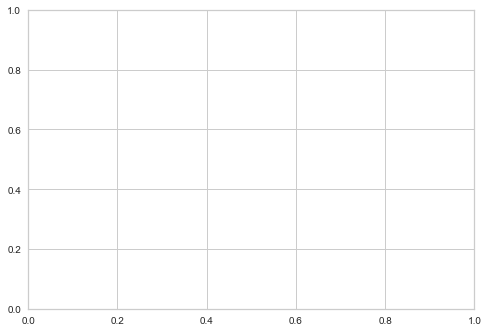

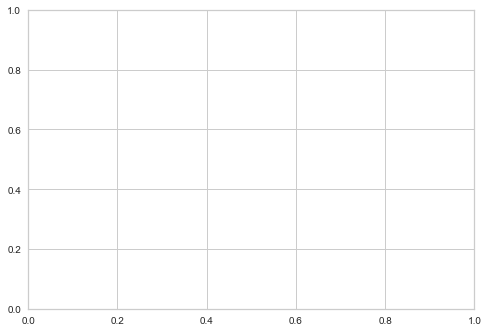

<Figure size 576x396 with 0 Axes>

In [204]:
evaluate_model(tuned_lg)

In [205]:
final_lg=finalize_model(tuned_lg)

In [206]:
predict_model(final_lg);

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN
